<div align="right"><h4>Author: Marko Kangrga</h4></div>
# Bond Screen using CapIQ Data

Attempt to run a simple linear regression on a population of bonds downloaded from [Capital IQ](https://www.capitaliq.com/) to detect outliers and screen for relative value opportunities to identify where to focus a deeper dive work.

The Excel files contain ~70 columns, containing bond-specific descriptive fields, such as coupon, maturity, covenants, etc., as well as company fundamental metrics, such as Net Debt/EBITDA, EV/EBITDA, EBITDA margin, Debt/Capital ratio, etc. The files need to be combined in a Pandas dataframe, which will be cleaned up and used to run a multiple linear regression on the data, targeting YTW as an independent variable. This is just a proof of concept - eventually the independent variable should be either spread-to-worst or option-adjusted-spread.

In [275]:
import re, glob, os, time, datetime
from dateutil.parser import parse
import pandas as pd
pd.options.display.max_columns = None
from xlsxwriter.utility import xl_rowcol_to_cell, xl_cell_to_rowcol
import numpy as np
import scipy
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import blackscholes
%matplotlib inline

from sklearn import ensemble, neural_network, tree, linear_model, kernel_ridge, neighbors, svm, tree, naive_bayes
from sklearn import preprocessing, metrics, decomposition, preprocessing, model_selection, feature_selection
from sklearn.externals import joblib
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.base import TransformerMixin, BaseEstimator

from IPython.display import display, HTML, clear_output
display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 95%; }    div#maintoolbar-container { width: 99%; }
</style>
"""))

import field_constants
matplotlib.rcParams['figure.figsize'] = (16.0, 8.0)

### Dataset buildout
Run once to build pickle from Excel files downloaded from a broad CapiatalIQ Screen

In [246]:
# dataset_path = os.path.join('datasets', 'us_europe_ds', '20180430')
# files = [f for f in os.listdir(os.path.join(dataset_path, 'excel'))]
# df = pd.read_excel(os.path.join(dataset_path, 'excel', files[0]), skiprows=7)
# for file in files[1:]:
#     df = df.append(pd.read_excel(os.path.join(dataset_path, 'excel', file), skiprows=7))
# df.reset_index(inplace=True, drop=True)
# df.to_pickle(os.path.join(dataset_path, 'dataset.pkl'))

### Load and preview the dataset
Load dataset from a pickled CapIQ screen

In [245]:
dataset_path = os.path.join('datasets', 'us_europe_ds', '20180430')
df = pd.read_pickle(os.path.join(dataset_path, 'dataset.pkl'))

# Map CapitalIQ field names to short, presentable names that can be more easily managed
numeric_fields, short_column_names, column_mapping,\
bond_id_columns,ratings_sorted, numeric_fields_mapped,\
group_categories, sorted_results_mapping, sorted_results_columns = field_constants.get_fields(df)
df.head(3)

,Maturity Date,Issuer,Exchange:Ticker,Fixed Income Security Type,Seniority Level,Coupon Rate (%),Coupon Type,Offering Date,"Offering Amount ($USDmm, Historical rate)","Amount Outstanding ($USDmm, Today's rate)",S&P Security Rating - Issue Credit Rating - Local Currency LT [Latest] (Rating),S&P Security Credit Rating Date - Issue Credit Rating - Local Currency LT [Latest] (Rating Date),Ultimate Parent Name,Yield to Worst (%) [Latest],Duration [Latest],Net Debt/EBITDA [LTM] [Issuer],Net Debt/(EBITDA-CAPEX) [LTM] [Issuer],Next Call Date,Next Call Price,Industry Classifications [Issuer],Primary Sector [Issuer],Primary Sector [Ultimate Parent],No of Analysts (Latest) [Issuer],No of Analysts (Latest) [Ultimate Parent],% Price Change (%) [3 Months],Price [Latest],Headquarters - Country [Issuer],Headquarters - Country [Ultimate Parent],"Amount Outstanding ($USDmm, Historical rate)",S&P Security Rating - Issue Credit Rating - Foreign Currency LT [Latest] (Rating),S&P Security Credit Rating Date - Issue Credit Rating - Foreign Currency LT [Latest] (Rating Date),Excel Security ID,"Offering Price ($USD, Historical rate)",Offering Yield (%),"Principal Amount ($USD, Historical rate)",Benchmark Spread (bps),Gross Spread (bps),Payment Frequency,Evaluation Date,Convexity [Latest],Conversion Security,Conversion Price ($),Conversion Security Price ($),Conversion Premium,Bondholder Protective,Issuer Restrictive,Subsidiary Restrictive,EBITDA Margin % [LTM] [Issuer],EBITDA Margin % [LTM] [Ultimate Parent],Security Tickers [Issuer],Security Tickers [Ultimate Parent],Country of Incorporation [Issuer],Total Debt/Capital % [Latest Quarter] [Issuer],Total Debt/Capital % [Latest Quarter] [Ultimate Parent],"EBITDA [LTM] ($USDmm, Historical rate) [Issuer]","EBITDA [LTM] ($USDmm, Historical rate) [Ultimate Parent]","Total Enterprise Value [My Setting] [Latest] ($USDmm, Historical rate) [Issuer]","Total Enterprise Value [My Setting] [Latest] ($USDmm, Historical rate) [Ultimate Parent]",Security Currency,Primary Industry [Issuer],Est. Annual Revenue Growth - 2 Yr % - Capital IQ [Latest] [Issuer],Est. Annual Revenue Growth - 2 Yr % - Capital IQ [Latest] [Ultimate Parent],"EBITDA - Capital IQ [NTM] ($USDmm, Historical rate) [Issuer]","EBITDA - Capital IQ [NTM] ($USDmm, Historical rate) [Ultimate Parent]",Est. Annual EBITDA Growth - 2 Yr % - Capital IQ [Latest] [Issuer],Est. Annual EBITDA Growth - 2 Yr % - Capital IQ [Latest] [Ultimate Parent],"EBITDA, 1 Yr Growth % [LTM] (%) [Issuer]","EBITDA, 1 Yr Growth % [LTM] (%) [Ultimate Parent]","Net Debt [Latest Quarter] ($USDmm, Historical rate) [Issuer]","Net Debt [Latest Quarter] ($USDmm, Historical rate) [Ultimate Parent]",Excel Company ID [Ultimate Parent],Geographic Locations [Issuer],Geographic Locations [Ultimate Parent]
0,Perpetual,Technicolor SA (ENXTPA:TCH),ENXTPA:TCH,Corporate Debentures,Subordinate,0,Variable,2005-09-26 00:00:00,601.7,605.25,-,-,Technicolor SA (ENXTPA:TCH),8.995,61.414,3.39,4.38,-,-,Consumer Discretionary (Primary); Entertainmen...,Consumer Discretionary,Consumer Discretionary,10,10,0,0.450,France,France,605.25,-,-,IQT31867668,99.3,0,1210.5,3.63,-,-,2018-04-27,-,-,-,-,-,-,-,-,5.41,5.41,DB:TNM1; ENXTPA:TCH; LSE:0MV8; OTCPK:TCLR.Y; O...,DB:TNM1; ENXTPA:TCH; LSE:0MV8; OTCPK:TCLR.Y; O...,France,76.6,76.6,275,275,1565.2,1565.2,Euro,Movies and Entertainment,-2.16,-2.16,334.9,334.9,3.02,3.02,-26.6,-26.6,931.8,931.8,IQ93471,Europe (Primary),Europe (Primary)
1,Perpetual,UniCredit S.p.A. (BIT:UCG),BIT:UCG,Corporate Convertible,Subordinate,5.375,Variable,2017-12-20 00:00:00,1187.9,1210.51,-,-,UniCredit S.p.A. (BIT:UCG),0.002,60.682,-,-,2025-06-03 00:00:00,100,Banks (Primary); Banks (Primary); Diversified ...,Financials,Financials,38,38,-4.99,99.875,Italy,Italy,1210.51,-,-,IQT547028368,100,-,242101,4.93,-,Semi-Annual,2018-04-27,-,-,-,-,-,-,-,-,-,-,BIT:UCG; BMV:UCG N; DB:CRIN; LSE:0RLS; LSE:0RL...,BIT:UCG; BMV:UCG N; DB:CRIN; LSE:0RLS; LSE:0RL...,Italy,-,-,-,-,-,-,Euro,Diversified Banks,1.99,1.99,-,-,-,

### Helper functions for transforming the dataset

The above dataset is clearly messy. Below functions help with cleaning up the dataset and mapping column names to something more readable.

In [233]:
def clean_df(df):
    '''Clean up dataset: rename columns, screen out very distressed names, force convert
    numeric columns, clean up dates, combine local/foreign ratings and apply specific fixes.'''
    
    df = df.copy()
    df = df.rename(column_mapping, axis=1)
    df = df.loc[df['YTW'] < 25, :]
    df.loc[:, numeric_fields_mapped] = df.loc[:, numeric_fields_mapped].apply(pd.to_numeric, errors='coerce')
    df = df.pipe(date_cleanup)
    df = df.pipe(ratings_cleanup)
    df = df.pipe(combine_ratings)
    df = df.pipe(specific_fixes)
    df = df.sort_values('Issuer')
    return df

def get_bond_delta(row):
    "Get the 'delta' of a callable bond using a simple Black model. To be used with df.apply() pandas function"
    
    s, k, t = row.values
    if np.isnan(k) or t <= 0:
        return np.nan
    try:
        delta = blackscholes.BSMerton([1, s, k, .02, .00, t*365, .2]).delta()
    except:
        return np.nan
    return delta[0]

def engineer_features(df):
    "Add calcluated features, such as EV/EBITDA, winsorize extreme values, and calculate callable bond delta/premium."
    
    df = df.pipe(add_features)
    df = df.pipe(winsorize, ['Net Debt/EBITDA'], 0.002)
    df['Call Delta'] = df[['Price', 'Next Call Price', 'Years to Next Call']].apply(get_bond_delta, axis=1)
    df['Call Premium'] = ((df['Next Call Price'] / df['Price'])**(1/df['Years to Next Call'].clip(lower=1)) - 1) * 100
    mask = df_clean['Sector'] == '-'
    df.loc[mask, 'Sector'] = df.loc[mask, 'Sector (Parent)']
#     df = df.pipe(add_zscore)
    return df

def add_features(df):
    'Add various calculated fields.'
    
    df.loc[:, 'EV/EBITDA Fwd'] = df['EV'] / df['NTM EBITDA']
    df.loc[:, 'EV/EBITDA Fwd (Parent)'] = df['EV (Parent)'] / df['NTM EBITDA (Parent)']
    df.loc[:, 'Net Debt/EBITDA'] = df['Net Debt (Parent)'] / df['EBITDA (Parent)']
    df.loc[:, 'Net Debt/EBITDA Fwd (Parent)'] = df['Net Debt (Parent)'] / df['NTM EBITDA (Parent)']
    df.loc[:, 'Current Yield'] = (df['Coupon'] / df['Price']) * 100
#     df.loc[:, 'Net Debt/EBITDA Fwd (Parent)'] = df.loc[:, 'Net Debt/EBITDA Fwd (Parent)'].fillna(df['Net Debt/EBITDA'])
    return df
    
def date_cleanup(df):
    '''Convert perpetual maturities to specific long-term maturities to allow for computations.
    Add Years to Maturity and Years to Next Call fields.'''
    
    df.loc[df['Maturity Date'] == 'Perpetual', 'Maturity Date'] = parse('2118-12-31')
    df['Years to Maturity'] = (pd.to_datetime(df['Maturity Date'])-datetime.datetime.today())/datetime.timedelta(days=1)/365
    df['Years to Next Call'] = pd.to_datetime(df['Next Call Date'], errors='coerce').apply(
        lambda x: np.round((x-datetime.datetime.today())/datetime.timedelta(days=1)/365, decimals=2) if pd.notna(x) else np.nan)
    return df

def ratings_cleanup(df):
    'Remove S&P specific designators from ratings.'
    
    df.loc[:, 'Rating (Local Currency)'] = df.loc[:, 'Rating (Local Currency)'].apply(lambda x: x.replace(' (sf)', ''))
    df.loc[:, 'Rating (Foreign Currency)'] = df.loc[:, 'Rating (Foreign Currency)'].apply(lambda x: x.replace(' (sf)', ''))
    return df

def combine_ratings(df):
    'Combine local and foreign currency ratings from the S&P.'

    df['Rating'] = df['Rating (Local Currency)'].replace('-', np.nan).fillna(df['Rating (Foreign Currency)'])
    df['Rating'] = df['Rating'].replace('AA-/A-1+', '')
    return df

def specific_fixes(df):
    # fix Roche bond call price from 1000 to 100
    df.loc[df['Security ID'] == 'IQT315939319', 'Next Call Price'] = 100
    # fix Intel bond call price from 1000 to 100
    df.loc[df['Security ID'] == 'IQT338089502', 'Next Call Price'] = 100
    return df

def encode_ratings(df):
    'Encoding ratings in a single field based on a sorted list of ratings, rather than one-hot encoder.'
    encoded_ratings_dict = dict([(k, v) for k, v in zip(ratings_sorted, range(1,len(ratings_sorted)+1))])
    df['Rating'] = df['Rating'].apply(lambda x: encoded_ratings_dict[x])
    return df

def winsorize(df, columns, percentile=0.005):
    '''Winsorization function based on percentile.

    Parameters
    ----------
    columns : list
        list of columns to apply winsorization to
        
    percentile : float, default: 0.005
        Percentile to winsorize to

    Returns
    ----------
    Pandas dataframe with winsorization applied to selected columns.
    '''

    numeric_fields_mapped = [column_mapping[field] for field in numeric_fields]
    for field in columns:
        df.loc[df[field].notna(), field] = scipy.stats.mstats.winsorize(df.loc[df[field].notna(), field], limits=(0, percentile))
    return df
    
def fillna_mean(df, columns, group):
    '''Fill NaN with means from a group.

    Parameters
    ----------
    columns : list
        list of columns to apply group means to NaN values
        
    group : string
        Column name to group by

    Returns
    ----------
    Pandas dataframe with group means applied to selected columns.
    '''

    df.loc[:, columns] = df.groupby(group)[columns].transform(lambda x: x.fillna(x.mean()))
    return df

def add_zscore(df):
    'Transform values to z-scores for all numerical columns.'
    numeric_fields_mapped = [column_mapping[field] for field in numeric_fields]
    numeric_fields_zscore = [field +'_zscore' for field in numeric_fields_mapped]
    df_zscores = df.loc[:, numeric_fields_mapped].apply(lambda x: (x - x.mean())/x.std(ddof=0))
    df_zscores.columns = numeric_fields_zscore
    df = df.join(df_zscores)
    return df

### Quick YTW/Maturity Visualization

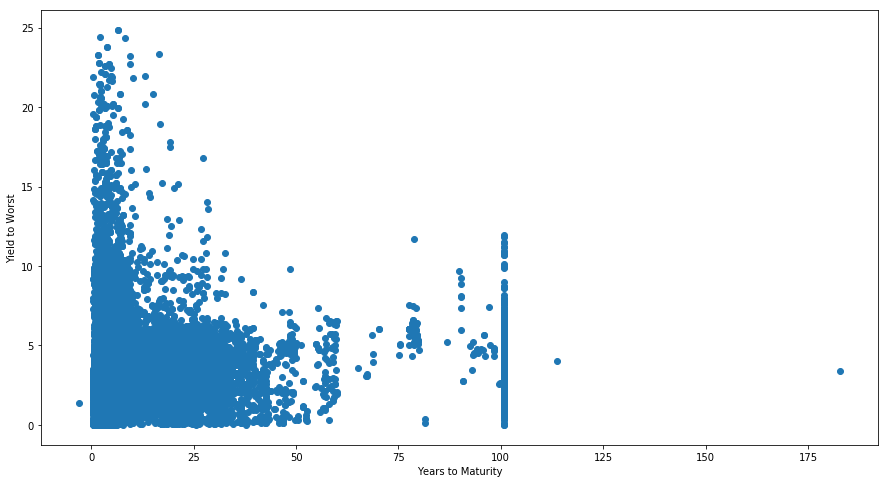

In [237]:
df_clean = clean_df(df)
df_analysis = engineer_features(df_clean)
fig, ax = plt.subplots(1, figsize=(15,8))
ax.scatter(df_analysis['Years to Maturity'],
           df_analysis['YTW']);
ax.set_xlabel('Years to Maturity')
ax.set_ylabel('Yield to Worst');

### Selecting reasonable features

In [238]:
features = [
     'Seniority',
     'Coupon',
     'Coupon Type',
     'Amount Outstanding',
     'Rating',
     'Duration',
     'Currency',
     'Sector',
     'Primary Industry',
     'Country of Incorporation',
     'Years to Maturity',
     'Security Type',

     'Next Call Price',
#      'Call Premium',
     'Call Delta',
     'Conversion Premium',
    
     'Net Debt/EBITDA',
     'Net Debt/EBITDA Fwd (Parent)',
     'EV/EBITDA Fwd',
     'EV/EBITDA Fwd (Parent)',
     'LTM EBITDA Growth (Parent)',
     '2y FWD EBITDA Growth (Parent)',
     '2y Fwd Revenue Growth (Parent)',
     'EBITDA Margin (Parent)',
     'Total Debt/Capital',
     'Total Debt/Capital (Parent)',
    
#      'Price Change (3m %)',
#      'Price',
#      'Current Yield',
#      'Years to Next Call',
#      'No of Analysts (Parent)',
#      'Price Change (3m %)',
]
le = preprocessing.LabelEncoder()
lb = preprocessing.LabelBinarizer()
mlb = preprocessing.MultiLabelBinarizer()

### Clean the dataset
The callable bond delta calulation takes a ~5 seconds - see if this can be optimized.

In [257]:
df_clean = clean_df(df)
df_analysis = engineer_features(df_clean)

# run the analysis only on US bonds
df_analysis = df_analysis[df_analysis['Country of Incorporation'] == 'United States']
df_analysis.head(3)

,Maturity Date,Issuer,Exchange:Ticker,Security Type,Seniority,Coupon,Coupon Type,Offering Date,Offering Amount,Amount Outstanding,Rating (Local Currency),Rating Date (Local Currency),Parent Name,YTW,Duration,Net Debt/EBITDA,Net Debt/(EBITDA-CAPEX),Next Call Date,Next Call Price,Industry Classifications,Sector,Sector (Parent),No of Analysts,No of Analysts (Parent),Price Change (3m %),Price,Country (Issuer),Country (Parent),"Amount Outstanding ($USDmm, Historical rate)",Rating (Foreign Currency),Rating Date (Foreign Currency),Security ID,Offering Price,Offering Yield,Principal Amount,Spread,Gross Spread,Payment Frequency,Evaluation Date,Convexity,Conversion Security,Conversion Price,Conversion Security Price,Conversion Premium,Bondholder Protective,Issuer Restrictive,Subsidiary Restrictive,EBITDA Margin,EBITDA Margin (Parent),Security Tickers (Issuer),Security Tickers (Parent),Country of Incorporation,Total Debt/Capital,Total Debt/Capital (Parent),EBITDA,EBITDA (Parent),EV,EV (Parent),Currency,Primary Industry,2y Fwd Revenue Growth,2y Fwd Revenue Growth (Parent),NTM EBITDA,NTM EBITDA (Parent),2y FWD EBITDA Growth,2y FWD EBITDA Growth (Parent),LTM EBITDA Growth,LTM EBITDA Growth (Parent),Net Debt,Net Debt (Parent),Excel Company ID,Geographic Locations [Issuer],Geographic Locations [Ultimate Parent],Years to Maturity,Years to Next Call,Rating,EV/EBITDA Fwd,EV/EBITDA Fwd (Parent),Net Debt/EBITDA Fwd (Parent),Current Yield,Call Delta,Call Premium
1575,2046-11-15 00:00:00,"21st Century Fox America, Inc.",-,Corporate Debentures,Senior Unsecured,4.75,Fixed,2017-02-22 00:00:00,400.0,400.0,BBB+,2016-11-15 00:00:00,"Twenty-First Century Fox, Inc. (NasdaqGS:FOXA)",4.412,15.434,2.138379,NaN,-,NaN,Consumer Discretionary (Primary); Media (Prima...,Consumer Discretionary,Consumer Discretionary,NaN,27.0,-7.95,105.443,United States,United States,400.0,-,-,IQT409751320,99.9,4.757,1000.0,NaN,NaN,Semi-Annual,2018-04-27,343.572,-,NaN,NaN,NaN,Cross Default; Change in Control Put Provision...,Sale of Assets; Consolidation or Merger,Sub. Guarantee,NaN,22.3,-,BMV:FOX *; DB:NXWB; DB:NWXA; LSE:0LHI; LSE:0LH...,United States,NaN,49.3,NaN,6540.0,NaN,83064.8,US Dollar,Movies and Entertainment,NaN,5.44,NaN,7407.0,NaN,3.72,NaN,-7.18,NaN,13985.0,IQ91031,United States of America (Primary),United States of America (Primary),28.551762,NaN,BBB+,NaN,11.214365,1.888079,4.504804,NaN,NaN
842,2095-12-01 00:00:00,"21st Century Fox America, Inc.",-,Corporate Debentures,Senior Unsecured,7.90,Fixed,2015-04-06 00:00:00,150.0,150.0,BBB+,2007-10-05 00:00:00,"Twenty-First Century Fox, Inc. (NasdaqGS:FOXA)",5.576,17.048,2.138379,NaN,-,NaN,Consumer Discretionary (Primary); Media (Prima...,Consumer Discretionary,Consumer Discretionary,NaN,27.0,-6.86,141.150,United States,United States,150.0,-,-,IQT288739581,99.5,7.940,1000.0,NaN,NaN,Semi-Annual,2018-04-27,561.966,-,NaN,NaN,NaN,Change in Control Put Provisions; Defeasance w...,-,Sub. Guarantee,NaN,22.3,-,BMV:FOX *; DB:NXWB; DB:NWXA; LSE:0LHH; LSE:0LH...,United States,NaN,49.3,NaN,6540.0,NaN,83064.8,US Dollar,Movies and Entertainment,NaN,5.44,NaN,7407.0,NaN,3.72,NaN,-7.18,NaN,13985.0,IQ91031,United States of America (Primary),United States of America (Primary),77.628474,NaN,BBB+,NaN,11.214365,1.888079,5.596883,NaN,NaN
8033,2036-10-17 00:00:00,"21st Century Fox America, Inc.",-,Corporate Debentures,Senior Unsecured,8.15,Fixed,2015-04-06 00:00:00,300.0,300.0,BBB+,2007-10-05 00:00:00,"Twenty-First Century Fox, Inc. (NasdaqGS:FOXA)",4.501,11.052,2.138379,NaN,-,NaN,Consumer Discretionary (Primary); Media (Prima...,Consumer Discretionary,Consumer Discretionary,NaN,27.0,-4.22,145.465,United States,United States,300.0,-,-,IQT288739726,99.2,8.220,1000.0,NaN,NaN,Semi-Annual,2018-04-27,167.141,-,NaN,NaN,NaN,Negative Pledge Covenant; Change in Control Pu...,Consolidation or Merger; Sale of Assets,Sub. Guarantee,NaN,22.3,-,BMV:FOX *; DB:NXWB; DB:NWXA; LSE:0LHH; LSE:0LH...,United States,NaN,49.3,NaN,6540.0,NaN,83064.8,US Dollar,Movies and Enterta

### Select features and generate the train dataset
Parsing the list of covenants takes the most time (~10 sec).

In [261]:
# exclude issues with no leverage info
# df_analysis = df_analysis[df_analysis['Net Debt/EBITDA'].notna()]
# df_analysis = df_analysis[df_analysis['Years to Maturity'] < 50]
train = df_analysis[features].copy()
fill_mean_columns = ['Net Debt/EBITDA', 'Net Debt/EBITDA Fwd (Parent)', 'EV/EBITDA Fwd (Parent)', '2y FWD EBITDA Growth (Parent)']

# apply_zscore = ['Amount Outstanding', 'Net Debt/EBITDA']
# train[apply_zscore] = train.groupby(['Country', 'Sector']).transform(lambda x: (x - x.mean())/x.std())[apply_zscore]

train = train.pipe(fillna_mean, columns=fill_mean_columns, group='Sector')
train = train.fillna(0)

# get one-hot encodings for all categoricals
train = pd.get_dummies(train)
train = train.drop('Rating_-', axis=1, errors='ignore')

# get one-hot encodings for all covenants
train['BP'] = df_analysis['Bondholder Protective'].apply(lambda x: x.split('; ')).apply(frozenset).to_frame(name='BP')
train['IR'] = df_analysis['Issuer Restrictive'].apply(lambda x: x.split('; ')).apply(frozenset).to_frame(name='IR')
train = train.fillna(0)

for bp in frozenset.union(*train.BP):
    train[bp] = train.apply(lambda _: int(bp in _.BP), axis=1)
train = train.drop(['-', 'BP'], axis=1)
for ir in frozenset.union(*train.IR):
    train[ir] = train.apply(lambda _: int(ir in _.IR), axis=1)
train = train.drop(['-', 'IR'], axis=1)
feature_names = train.columns
df_train_copy = train.copy()

# preprocess the dataset (standard scaler, etc)
pipeline = Pipeline([
    ('scale', preprocessing.StandardScaler()),
#     ('pca', decomposition.PCA()),
])

df_train_copy.head()

,Coupon,Amount Outstanding,Duration,Years to Maturity,Next Call Price,Call Delta,Conversion Premium,Net Debt/EBITDA,Net Debt/EBITDA Fwd (Parent),EV/EBITDA Fwd,EV/EBITDA Fwd (Parent),LTM EBITDA Growth (Parent),2y FWD EBITDA Growth (Parent),2y Fwd Revenue Growth (Parent),EBITDA Margin (Parent),Total Debt/Capital,Total Debt/Capital (Parent),Seniority_Junior Subordinate,Seniority_Not Ranked,Seniority_Senior Secured,Seniority_Senior Subordinate,Seniority_Senior Unsecured,Seniority_Subordinate,Coupon Type_-,Coupon Type_Fixed,Coupon Type_Step-Up,Coupon Type_Variable,Coupon Type_Zero,Rating_A,Rating_A+,Rating_A-,Rating_AA,Rating_AA+,Rating_AA-,Rating_AAA,Rating_B,Rating_B+,Rating_B-,Rating_BB,Rating_BB+,Rating_BB-,Rating_BBB,Rating_BBB+,Rating_BBB-,Rating_CC,Rating_CCC,Rating_CCC+,Rating_CCC-,Rating_D,Rating_NR,Currency_-,Currency_Australian Dollar,Currency_Brazilian Real,Currency_British Pound,Currency_Canadian Dollar,Currency_Czech Koruna,Currency_Euro,Currency_Hong Kong Dollar,Currency_Israeli Shekel,Currency_Japanese Yen,Currency_Mexican Peso,Currency_New Zealand Dollar,Currency_Norwegian Krone,Currency_South African Rand,Currency_Swedish Krona,Currency_Swiss Franc,Currency_Turkish New Lira,Currency_US Dollar,Sector_-,Sector_Consumer Discretionary,Sector_Consumer Staples,Sector_Energy,Sector_Financials,Sector_Healthcare,Sector_Industrials,Sector_Information Technology,Sector_Materials,Sector_Real Estate,Sector_Telecommunication Services,Sector_Utilities,Primary Industry_-,Primary Industry_Advertising,Primary Industry_Aerospace and Defense,Primary Industry_Agricultural Products,Primary Industry_Agricultural and Farm Machinery,Primary Industry_Air Freight and Logistics,Primary Industry_Airlines,Primary Industry_Alternative Carriers,Primary Industry_Aluminum,Primary Industry_Apparel Retail,"Primary Industry_Apparel, Accessories and Luxury Goods",Primary Industry_Application Software,Primary Industry_Asset Management and Custody Banks,Primary Industry_Auto Parts and Equipment,Primary Industry_Automobile Manufacturers,Primary Industry_Automotive Retail,Primary Industry_Biotechnology,Primary Industry_Brewers,Primary Industry_Broadcasting,Primary Industry_Building Products,Primary Industry_Cable and Satellite,Primary Industry_Casinos and Gaming,Primary Industry_Coal and Consumable Fuels,Primary Industry_Commercial Printing,Primary Industry_Commodity Chemicals,Primary Industry_Communications Equipment,Primary Industry_Computer and Electronics Retail,Primary Industry_Construction Machinery and Heavy Trucks,Primary Industry_Construction Materials,Primary Industry_Construction and Engineering,Primary Industry_Consumer Electronics,Primary Industry_Consumer Finance,Primary Industry_Copper,Primary Industry_Data Processing and Outsourced Services,Primary Industry_Department Stores,Primary Industry_Distillers and Vintners,Primary Industry_Distributors,Primary Industry_Diversified Banks,Primary Industry_Diversified Chemicals,Primary Industry_Diversified Metals and Mining,Primary Industry_Diversified REITs,Primary Industry_Diversified Real Estate Activities,Primary Industry_Diversified Support Services,Primary Industry_Drug Retail,Primary Industry_Education Services,Primary Industry_Electric Utilities,Primary Industry_Electrical Components and Equipment,Primary Industry_Electronic Components,Primary Industry_Electronic Equipment and Instruments,Primary Industry_Electronic Manufacturing Services,Primary Industry_Environmental and Facilities Services,Primary Industry_Fertilizers and Agricultural Chemicals,Primary Industry_Financial Exchanges and Data,Primary Industry_Food Distributors,Primary Industry_Food Retail,Primary Industry_Footwear,Primary Industry_Forest Products,Primary Industry_Gas Utilities,Primary Industry_General Merchandise Stores,Primary Industry_Gold,Primary Industry_Health Care Technology,Primary Industry_Healthcare Distributors,Primary Industry_Healthcare Equipment,Primary Industry_Healthcare Facilities,Primary Industry_Healthcare R

### Run a Random Forest regressor on all features to analyze feature importances

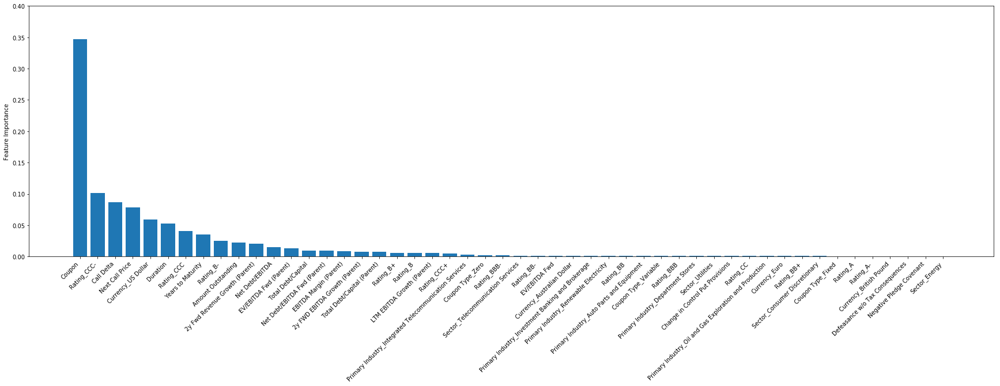

In [253]:
if __name__ == '__main__':
    # Feature importances
    clf_rf = ensemble.RandomForestRegressor(n_estimators=100, min_samples_leaf=5, max_depth=30, oob_score=True, n_jobs=-1)
    clf_rf.fit(pipeline.fit_transform(df_train_copy), df_analysis['YTW'])
    df_feature_importances = pd.DataFrame(clf_rf.feature_importances_, index=df_train_copy.columns, columns=['importance']).sort_values('importance', ascending=False)

top_features = 50
fig, ax = plt.subplots(1, figsize=(30,8))
ax.bar(df_feature_importances.head(top_features).index, df_feature_importances.head(top_features).importance, tick_label=df_feature_importances.head(top_features).index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right');
ax.set_ylim(0, .4);
ax.set_ylabel('Feature Importance');

### Select top X features to deal with the curse of dimensionality (more data would be nice) and generate the final train dataset

In [262]:
# use feature importance for feature selection
select_top_features = 40
feature_names = df_feature_importances.head(select_top_features).index
df_train = df_train_copy[feature_names].copy()
train = pipeline.fit_transform(df_train)

### View mean values of numerical features by sector

In [278]:
df_stats = df_analysis[features + ['Price Change (3m %)']].groupby('Sector').describe()
df_stats.loc[:, (slice(None), ['mean'])].applymap(lambda x: '{:.2f}'.format(x))

,2y FWD EBITDA Growth (Parent),2y Fwd Revenue Growth (Parent),Amount Outstanding,Call Delta,Conversion Premium,Coupon,Duration,EBITDA Margin (Parent),EV/EBITDA Fwd,EV/EBITDA Fwd (Parent),LTM EBITDA Growth (Parent),Net Debt/EBITDA,Net Debt/EBITDA Fwd (Parent),Next Call Price,Price Change (3m %),Total Debt/Capital,Total Debt/Capital (Parent),Years to Maturity
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
Sector,,,,,,,,,,,,,,,,,,
-,nan,nan,342.90,0.49,nan,6.14,5.38,nan,nan,nan,nan,nan,nan,104.86,-1.99,nan,nan,11.14
Consumer Discretionary,11.20,7.00,588.16,0.61,56.67,5.30,6.18,19.91,11.63,10.70,30.29,3.76,2.74,101.43,-2.91,247.30,67.59,9.71
Consumer Staples,5.94,4.24,697.33,0.65,nan,4.32,6.74,20.13,11.48,11.88,8.91,2.79,2.49,100.91,-2.87,63.31,60.04,10.42
Energy,15.95,11.93,582.56,0.61,17.25,5.76,6.22,33.48,8.46,9.01,111.60,4.65,3.23,101.53,-3.39,51.05,51.58,10.10
Financials,7.05,3.46,622.88,0.63,33.50,4.30,5.38,17.47,27.12,13.02,16.90,4.07,4.77,101.05,-1.89,63.94,61.04,9.32
Healthcare,5.66,5.18,734.86,0.65,31.76,4.37,6.97,25.45,11.43,11.24,6.90,2.34,2.02,100.92,-2.88,63.37,51.52,10.86
Industrials,10.13,6.23,516.42,0.64,32.88,4.91,6.73,20.87,10.97,11.33,10.43,3.14,2.53,101.31,-2.95,60.88,59.59,11.00
Information Technology,9.34,7.58,891.61,0.64,37.92,4.09,5.61,27.42,11.51,11.34,14.20,1.26,1.00,101.03,-2.37,54.98,54.81,8.18


### Visualize the distribution of 3-month % price change by sector

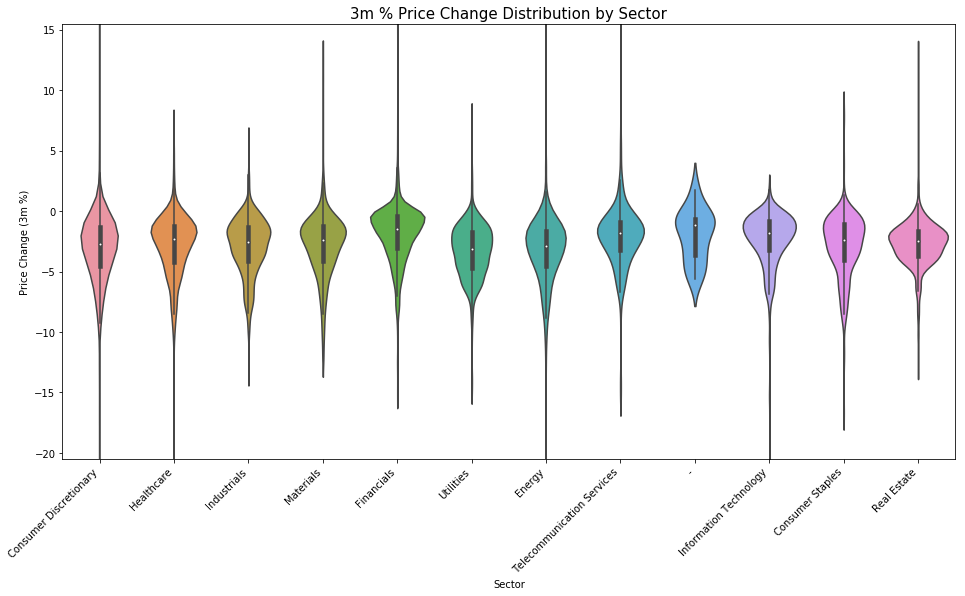

In [221]:
y_field = 'Price Change (3m %)'
splot = sns.violinplot(x='Sector', y=y_field, data=df_analysis)
splot.set_ylim(df_analysis[y_field].quantile([.001, .999]).values)
[(x.set_rotation(45), x.set_horizontalalignment('right')) for x in splot.get_xticklabels()]
splot.set_title("3m % Price Change Distribution by Sector", fontsize=15);

### Datapoint distribution by sector

In [281]:
df_analysis.pivot_table(index='Sector', aggfunc='count')#.div(df_clean.pivot_table(index='Sector', aggfunc='size'), axis=0).applymap(lambda x: '{:.1f}%'.format(x*100))

,2y FWD EBITDA Growth,2y FWD EBITDA Growth (Parent),2y Fwd Revenue Growth,2y Fwd Revenue Growth (Parent),Amount Outstanding,"Amount Outstanding ($USDmm, Historical rate)",Bondholder Protective,Call Delta,Call Premium,Conversion Premium,Conversion Price,Conversion Security,Conversion Security Price,Convexity,Country (Issuer),Country (Parent),Country of Incorporation,Coupon,Coupon Type,Currency,Current Yield,Duration,EBITDA,EBITDA (Parent),EBITDA Margin,EBITDA Margin (Parent),EV,EV (Parent),EV/EBITDA Fwd,EV/EBITDA Fwd (Parent),Evaluation Date,Excel Company ID,Exchange:Ticker,Geographic Locations [Issuer],Geographic Locations [Ultimate Parent],Gross Spread,Industry Classifications,Issuer,Issuer Restrictive,LTM EBITDA Growth,LTM EBITDA Growth (Parent),Maturity Date,NTM EBITDA,NTM EBITDA (Parent),Net Debt,Net Debt (Parent),Net Debt/(EBITDA-CAPEX),Net Debt/EBITDA,Net Debt/EBITDA Fwd (Parent),Next Call Date,Next Call Price,No of Analysts,No of Analysts (Parent),Offering Amount,Offering Date,Offering Price,Offering Yield,Parent Name,Payment Frequency,Price,Price Change (3m %),Primary Industry,Principal Amount,Rating,Rating (Foreign Currency),Rating (Local Currency),Rating Date (Foreign Currency),Rating Date (Local Currency),Sector (Parent),Security ID,Security Tickers (Issuer),Security Tickers (Parent),Security Type,Seniority,Spread,Subsidiary Restrictive,Total Debt/Capital,Total Debt/Capital (Parent),YTW,Years to Maturity,Years to Next Call
Sector,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-,0,0,0,0,29,29,29,13,14,0,0,29,0,28,29,29,29,29,29,29,29,29,0,0,0,0,0,0,0,0,29,29,29,29,29,0,29,29,29,0,0,29,0,0,0,0,0,0,0,29,14,5,5,29,29,28,22,29,29,29,26,29,29,29,29,29,29,29,29,29,29,29,29,29,4,29,0,0,29,29,14
Consumer Discretionary,672,955,674,978,1269,1269,1269,774,774,2,2,1269,2,1255,1269,1269,1269,1269,1269,1269,1269,1269,838,1105,828,1105,686,997,668,951,1269,1269,1269,1269,1269,543,1269,1269,1269,807,1086,1269,668,952,796,1058,744,1058,952,1269,774,1022,1129,1269,1269,1225,1173,1269,1269,1269,1194,1269,1269,1269,1269,1269,1269,1269,1269,1269,1269,1269,1269,1269,586,1269,796,1058,1269,1269,776
Consumer Staples,554,732,554,732,834,834,834,387,390,0,0,834,0,821,834,834,834,833,834,834,833,834,609,763,609,763,561,739,554,732,834,834,834,834,834,527,834,834,834,607,744,834,558,732,611,746,609,746,732,834,390,678,793,834,834,815,738,834,834,834,781,834,834,834,834,834,834,834,834,834,834,834,834,834,527,834,611,746,834,834,391
Energy,605,962,605,962,1078,1078,1078,732,738,1,1,1078,1,1077,1078,1078,1078,1078,1078,1078,1078,1078,785,1011,781,1011,610,966,605,950,1078,1078,1078,1078,1078,548,1078,1078,1078,748,984,1078,605,950,776,993,529,992,944,1078,738,845,1020,1077,1078,1048,1012,1078,1078,1078,1022,1078,1077,1078,1078,1078,1078,1078,1078,1078,1078,1078,1078,1078,593,1078,774,991,1078,1078,738
Financials,131,702,1109,2223,2645,2645,2645,954,956,5,3,2645,5,2423,2645,2645,2645,2613,2645,2645,2613,2645,429,1093,429,1093,359,1005,92,633,2645,2645,2645,2645,2645,953,2645,2645,2645,415,1063,2645,131,700,1627,2354,373,1064,700,2645,956,1552,2353,2644,2645,2437,1701,2645,2645,2645,2486,2645,2645,2645,2645,2645,2645,2645,2645,2645,2645,2645,2645,2645,1065,2645,1034,1503,2645,2645,964
Healthcare,573,753,584,763,940,940,940,508,510,8,8,940,8,924,940,940,940,940,940,940,940,940,654,791,652,789,584,763,583,762,940,940,940,940,940,494,940,940,940,630,783,940,583,762,667,779,628,779,762,940,510,741,829,937,940,921,888,940,940,940,896,940,940,940,940,940,940,940,940,940,940,940,940,940,522,940,667,779,940,940,510
Industrials,689,888,694,893,1111,1111,1111,687,689,2,2,1111,2,1095,1111,1111,1111,1108,1111,1111,1108,1111,800,893,800,893,696,895,689,888,1111,1111,1111,1111,1111,589,1111,1111,1111,784,888,1111,689,888,817,907,757,893,888,1111,689,898,958,1106,1111,1073,1033,1111,1111,1111,1060,1111,1111,1111,1111,1111,1111,1111,1111,1111,1111,1111,1111,1111,620,1111,815,905,1111,1111,690
Information Technology,559,628,563,634

### Regressor dictionary
Adding any combination of sk-learn regressors to run the dataset through. Regressors can be chosen using the runthrough of all linear regressors in scikit-learn at the bottom of the notebook.

In [263]:
sk_regressors = {
    'BRidge':     linear_model.BayesianRidge(n_iter=100000, tol=1e-3, alpha_1=10**-6, alpha_2=10**-0.25, lambda_1=10**-6, lambda_2=10**-6),
    'ElasticNet': linear_model.ElasticNet(1e-06, l1_ratio=0.1, max_iter=1000000, normalize=True, random_state=1, tol=1e-05, warm_start=False),
#     'ElasticNet0': linear_model.ElasticNet(alpha=1e-05, copy_X=True, fit_intercept=True, l1_ratio=0.3, max_iter=100000, normalize=False,
#                                           positive=False, precompute=False, random_state=1, selection='cyclic', tol=1e-05, warm_start=False),
#     'ElasticNet1': linear_model.ElasticNet(1e-05, l1_ratio=0.1, max_iter=1000000, normalize=True, random_state=1, tol=1e-05, warm_start=False),
#     'ElasticNet2': linear_model.ElasticNet(1e-06, l1_ratio=1.0, max_iter=1000000, normalize=True, random_state=1, tol=1e-05, warm_start=False),
#     'ElasticNet3': linear_model.ElasticNet(1e-05, l1_ratio=0.5, max_iter=1000000, normalize=True, random_state=1, tol=1e-05, warm_start=False),
#     'LassoLarsIC':linear_model.LassoLarsIC(criterion='bic', eps=1e-5),
#     'MNaiveBayes': naive_bayes.MultinomialNB(),
#     'NN': neural_network.MLPRegressor(hidden_layer_sizes=(50,50,50), max_`iter=1000, ),
#     'KRidge':     kernel_ridge.KernelRidge(alpha=10**1.5, kernel='polynomial', gamma=None, degree=1, coef0=1, kernel_params=None),
#     'RF':         ensemble.RandomForestRegressor(n_estimators=50, min_samples_leaf=50),
}

### Run the dataset through the above ML algos using randomized K-fold cross-validation
Output shows $R^{2}$ scores for each regressor in each of the cross-validated trials

In [272]:
n_splits = 4
df_clf = pd.DataFrame(index=sk_regressors.keys(), columns=['CV' + str(i+1) for i in range(n_splits)])
for clf in sk_regressors:
    df_clf.loc[clf, :] = model_selection.cross_val_score(sk_regressors[clf], train, y=df_analysis['YTW'], cv=model_selection.KFold(n_splits=n_splits, shuffle=True, random_state=1), scoring='r2')
    #     print(clf, model_selection.cross_val_score(sk_regressors[clf], train, y=df_analysis['YTW'], cv=model_selection.KFold(n_splits=n_splits, shuffle=True, random_state=1), scoring='r2'))
df_clf.applymap(lambda x: '{:.1f}%'.format(x*100))

,CV1,CV2,CV3,CV4
BRidge,61.3%,70.3%,69.0%,61.3%
ElasticNet,61.4%,70.4%,68.8%,61.1%


### Select the regressor to use in the analysis/screen and visualize the output

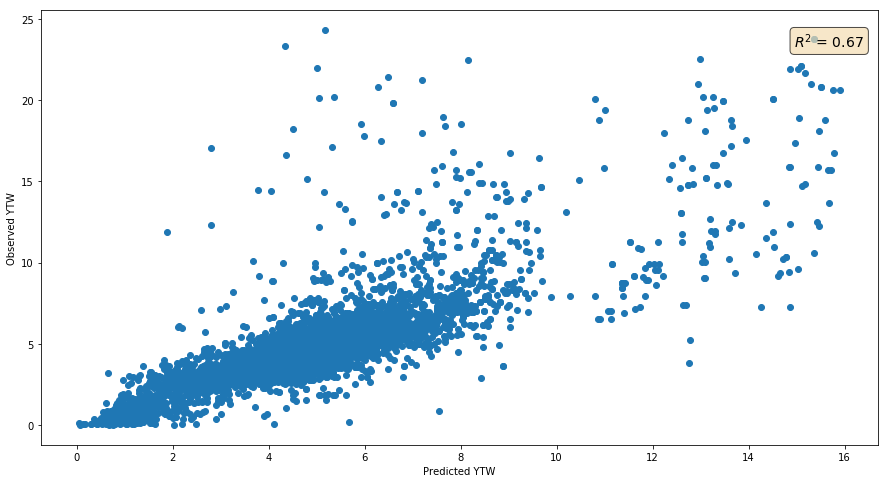

In [274]:
clf = sk_regressors['ElasticNet']
train = pipeline.fit_transform(train)
predicted = clf.fit(train, df_analysis['YTW']).predict(train)
fig, ax = plt.subplots(1, figsize=(15,8))
ax.scatter(predicted, df_analysis['YTW'])
ax.text(0.90, 0.95, r"$R^2$ = {:.2f}".format(metrics.r2_score(df_analysis['YTW'], predicted)), transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
ax.set_xlabel("Predicted YTW")
ax.set_ylabel("Observed YTW");

### Output the training dataset to Excel (linear regressors only)
This is meant to assist with analyzing the impact each feature has on the output by manually sensitizing each feature in Excel and immediately seeing the output change.

In [276]:
df_forensics = pd.DataFrame(columns=feature_names)
df_forensics.loc['mean',:] = df_train.mean()
df_forensics.loc['stdev',:] = df_train.std()
df_forensics.loc['coeffs',:] = clf.coef_
df_forensics = df_forensics.append(df_train)
df_forensics.insert(0, 'Intercept', 1)
df_forensics.insert(0, 'Issuer', df_analysis['Issuer'])
df_forensics.loc[['mean', 'stdev'],'Intercept'] = ''
df_forensics.loc['coeffs','Intercept'] = clf.intercept_
n_rows, n_cols = df_forensics.shape

writer = pd.ExcelWriter('fancy.xlsx', engine='xlsxwriter')
df_forensics.to_excel(writer, index=True, sheet_name='train', freeze_panes=(4,1))
workbook = writer.book
train_sheet = writer.sheets['train']
header_format = workbook.add_format({'text_wrap':'true','bold':'true','align':'center'})
header_format.set_border()
for i, col_name in enumerate(df_forensics.columns):
    train_sheet.write(0, i+1, col_name, header_format)
train_sheet.set_row(0, 50)#, cell_format=header_format)
[fmt.set_font_size(8) for fmt in workbook.formats]
scaled_sheet = workbook.add_worksheet('train_scaled')

# Create scaled worksheet, since the regressors expect scaled feature inputs
for row in range(4, n_rows+1):
    for col in range(3, n_cols+1):
        scaled_sheet.write_formula(row, col, '=(train!{}-train!{})/train!{}'.format(xl_rowcol_to_cell(row, col), xl_rowcol_to_cell(1, col), xl_rowcol_to_cell(2, col)))

# Add intercept and the regression formula
for row in range(4, n_rows+1):
    scaled_sheet.write_formula(row, 2, '1')
    train_sheet.write_formula(row, n_cols+2, '=SUMPRODUCT({}:{}, train_scaled!{}:{})'.format(xl_rowcol_to_cell(3,2), xl_rowcol_to_cell(3,n_cols),
                                                                                             xl_rowcol_to_cell(row,2), xl_rowcol_to_cell(row,n_cols)))
train_sheet.write(0, n_cols+2, 'Predicted YTW', header_format)
train_sheet.write(0, n_cols+1, 'Observed YTW', header_format)
for i, value in enumerate(df_analysis['YTW'].values):
    train_sheet.write(i+4, n_cols+1, value)
writer.save()

### Prepare the results for visualizing in Bokeh
Bokeh doesn't deal well with spaces... Creating a separate dataframe for that.

In [283]:
results = df_analysis.copy()
results['YTW_true'] = df_analysis['YTW']
results['YTW_predicted'] = clf.predict(train)
results['YTW_diff'] = df_analysis['YTW'] - results['YTW_predicted']
results = results.drop_duplicates(subset=bond_id_columns)
results['Next Call Date'] = results['Next Call Date'].apply(lambda x: x.strftime('%Y-%m-%d') if isinstance(x, datetime.datetime) else '')
results['Next Call Price'] = results['Next Call Price'].apply(lambda x: str(x) if pd.notna(x) else '')
leverage_groups = [0, 2, 4, 5, 6, 8, 10]
for i in range(len(leverage_groups)-1):
    results.loc[results["Net Debt/EBITDA"].between(leverage_groups[i],leverage_groups[i+1]),"Leverage"] = "{:.0f}-{:.0f}x".format(leverage_groups[i], leverage_groups[i+1])
sorted_results_columns = [y for x in [sorted_results_mapping[grp] for grp in group_categories] for y in x]

results_chart = results.drop("Security ID", axis=1).drop_duplicates()
results_chart.columns = [column.replace(" ", "_") for column in results_chart.columns]
results_chart.columns = [column.replace("/", "_") for column in results_chart.columns]
results_chart.columns = [column.replace("(", "") for column in results_chart.columns]
results_chart.columns = [column.replace(")", "") for column in results_chart.columns]
results_chart.columns = [column.replace("%", "pct") for column in results_chart.columns]

### Sort and reindex the dataset for a cleaner presentation in Excel and export

In [218]:
def process_index(group_categories, sorted_results_mapping):
    tuple_list = []
    for category in group_categories:
        elements = sorted_results_mapping[category]
        for element in elements:
            tuple_list.append((category, element))
    return tuple_list
results_multiindex = pd.MultiIndex.from_tuples(process_index(group_categories, sorted_results_mapping))
results_present = pd.DataFrame(data=results[sorted_results_columns].values, index=results.index, columns=results_multiindex)
results_present.fillna('-').to_excel('results_output.xlsx')

### Prepare the results for visualizing in Bokeh
Output a scatterplot of all bond issues with X axis showing 'predicted' YTW and Y axis showing the observed YTW. Size the bubbles according to the Amount Outstanding of the Issue and color each bubble according to the bond's rating.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
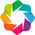

:Layout
   .US_Bonds.I                   :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Hyphen_minus.I               :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Consumer_Discretionary.I     :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Consumer_Staples.I           :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Energy.I                     :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Financials.I                 :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Healthcare.I                 :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Industrials.I                :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Information_Technology.I     :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Materials.I                  :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Real_Estate.I                :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)
   .Telecommunication_Services.I :Scatter   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_O

In [309]:
from bokeh.models import HoverTool
from bokeh.plotting import figure, show, output_file
import holoviews as hv
hv.extension('bokeh', 'matplotlib')

hover = HoverTool(tooltips=[
    ("Issuer", "@Issuer"),
    ("Coupon", "@Coupon"),
    ("Maturity", "@Maturity_Date{%F}"),
    ("Seniority", "@Seniority"),
    ("Rating", "@Rating"),
    ("Amt. Outstanding", "@Amount_Outstanding m"),
    ("Sector", "@{Sector}"),
    ('Country', '@Country_of_Incorporation'),
    ("LTM Leverage", "@Net_Debt_EBITDA"),
    ("NTM Leverage", "@Net_Debt_EBITDA_Fwd_Parent"),
    ("Total Debt/Capital %", "@Total_Debt_Capital_Parent"),
    ("Call Price", "@Next_Call_Price"),
    ("Call Date", "@Next_Call_Date"),
    ("Price", "@Price"),
    ('Current Yield', "@Current_Yield"),
    ('3m % change', '@Price_Change_3m_pct'),
    ("YTW", "@YTW_true"),
    ("YTW est.", "@YTW_predicted"),
    ],
    formatters={
        'Maturity_Date':'datetime',
    },
)

palette = hv.Palette.colormaps['RdYlGn_r']
palette = hv.plotting.util.process_cmap(palette, ncolors=len(ratings_sorted[:-6]), categorical=True)
explicit_mapping = dict([(k, v) for k, v in zip(ratings_sorted, palette)])
opts = dict(tools=[hover], toolbar='right', show_grid=True, width=1200, height=800, alpha=0.7,
            size_index='Amount_Outstanding',color_index='Rating', cmap=explicit_mapping, show_legend=False, scaling_factor=0.05, framewise=True)

vdims = ['Issuer', 'Seniority', 'Rating', 'Coupon', 'Sector','Country_of_Incorporation', 'Price', 'Maturity_Date', 'Net_Debt_EBITDA', 'Net_Debt_EBITDA_Fwd_Parent', 'Total_Debt_Capital_Parent',
         'Leverage', 'Amount_Outstanding', 'Next_Call_Price', 'Next_Call_Date', 'Price_Change_3m_pct', 'Current_Yield', 'YTW_true', 'YTW_predicted']
kdims = ['YTW_predicted', 'YTW_true']

# scatter = hv.Scatter(data=results_chart, kdims=kdims, vdims=vdims, group='Global Bonds').options(**opts)
scatter_us = hv.Scatter(data=results_chart[results_chart["Country_of_Incorporation"] == 'United States'], kdims=kdims, vdims=vdims, group='US Bonds').options(**opts)

# scatter_sector = scatter.groupby(['Country','Sector']).options(**opts)
chart_list = [scatter_us]
for sector in sorted(results_chart.Sector.unique()):
    scatter_sector = hv.Scatter(data=results_chart[(results_chart["Sector"] == sector) & (results_chart["Country_of_Incorporation"] == 'United States')],
                                kdims=kdims, vdims=vdims, group=sector).options(**opts)
    chart_list.append(scatter_sector)

hv.Layout(chart_list).options(tabs=True, toolbar='right', shared_axes=False).cols(1)

### Output the chart to an HTML file
For more interactive visualization, an active Python server is needed. For viewing on machines without python, this can be achieved by running a bokeh server (below) and pointing the browser to the server IP address and port specified in the Bokeh server instance.

In [310]:
hv.renderer('bokeh').save(hv.Layout(chart_list).options(tabs=True, toolbar='right', shared_axes=False).cols(1),'output')

### Start a Bokeh server for interactive visualization outside of the Jupyter Notebook
For more interactive visualization, an active Python server is needed. For viewing on machines without python, this can be achieved by running a bokeh server (below) and pointing the browser to the server IP address and port specified in the Bokeh server instance.

In [295]:
from bokeh.server.server import Server

scatter = hv.Scatter(data=results_chart, kdims=kdims, vdims=vdims, group='Global Bonds').options(**opts)
scatter_us = hv.Scatter(data=results_chart[results_chart["Country_of_Incorporation"] == 'United States'], kdims=kdims, vdims=vdims, group='US Bonds').options(**opts)

# scatter_sector = scatter.groupby(['Country','Sector']).options(**opts)
chart_list = [scatter, scatter_us]
for sector in sorted(results_chart.Sector.unique()):
    scatter_sector = hv.Scatter(data=results_chart[(results_chart["Sector"] == sector) & (results_chart["Country_of_Incorporation"] == 'United States')],
                                kdims=kdims, vdims=vdims, group=sector).groupby('Leverage').options(**opts)
    chart_list.append(scatter_sector)

scatter_leverage = hv.Layout(chart_list).options(tabs=True, toolbar='right', shared_axes=False).cols(1)
renderer = hv.renderer('bokeh')
renderer = renderer.instance(mode='server')
app = renderer.app(scatter_leverage)#, show=True, websocket_origin='localhost:51865')
server = Server({'/': app}, port=51865, allow_websocket_origin=['*'])
server.start()
server.show('/')

INFO:bokeh.server.server:Starting Bokeh server version 0.12.15 (running on Tornado 5.0.1)
INFO:tornado.access:200 GET / (::1) 2355.00ms
INFO:tornado.access:101 GET /ws?bokeh-protocol-version=1.0&bokeh-session-id=Q9ZVpy4o6mLagNpQ2oFe8NPCYTqicbngb0I0jGZTZMBL (::1) 1.00ms
INFO:bokeh.server.views.ws:WebSocket connection opened
INFO:bokeh.server.views.ws:ServerConnection created
INFO:bokeh.server.views.ws:WebSocket connection closed: code=1001, reason=None


### Stop the Bokeh server

In [296]:
server.stop()

### Other interactive visualizations...

In [ ]:
# hv.plotting.list_cmaps()
palette = hv.Palette.colormaps['RdYlGn_r']
palette = hv.plotting.util.process_cmap(palette, ncolors=len(ratings_sorted[:-5]), categorical=True)
explicit_mapping = dict([(k, v) for k, v in zip(ratings_sorted, palette)])
ds = hv.Dataset(data=results_chart[results_chart['Country of Incorporation'] == 'United States'],
               kdims=kdims, vdims=vdims)
opts = dict(tools=[hover], toolbar='right', show_grid=True, width=1000, height=800, alpha=0.6,
            size_index='Amount_Outstanding', color_index='Rating', cmap=explicit_mapping, show_legend=False, scaling_factor=0.05, framewise=True)
hm = ds.to(hv.Points, kdims=kdims, vdims=vdims, group='US Bonds').options(**opts)

In [90]:
ds.to(hv.BoxWhisker, 'Rating', 'Net_Debt_EBITDA', groupby=['Sector']).options(width=800, height=800, xrotation=30, box_fill_color=hv.Palette('Category20'), framewise=True)

:HoloMap   [Sector]
   :BoxWhisker   [Rating]   (Net_Debt_EBITDA)

In [301]:
opts = dict(tools=[hover], toolbar='right', show_grid=True, width=1000, height=800, alpha=0.8,
            size_index='Amount_Outstanding',color_index='Rating', cmap=explicit_mapping, show_legend=False, scaling_factor=0.05, framewise=True)

scatter_sector = hv.Points(data=results_chart[(results_chart["Country_of_Incorporation"] == 'United States')],
                            kdims=kdims, vdims=vdims).groupby(['Sector', 'Leverage']).options(**opts)
scatter_sector

:HoloMap   [Sector,Leverage]
   :Points   [YTW_predicted,YTW_true]   (Issuer,Seniority,Rating,Coupon,Sector,Country_of_Incorporation,Price,Maturity_Date,Net_Debt_EBITDA,Net_Debt_EBITDA_Fwd_Parent,Total_Debt_Capital_Parent,Leverage,Amount_Outstanding,Next_Call_Price,Next_Call_Date,Price_Change_3m_pct,Current_Yield,YTW_true,YTW_predicted)

### Clustering Analysis
If certain bonds tend to cluster together, run a clustering DBSCAN algo to identify clusters and examine the underlying outliers

Estimated number of clusters: 2


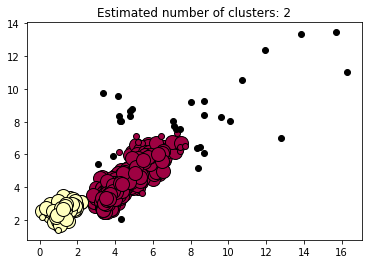

In [111]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

X = results[results['Country'] == 'United States'][['YTW_true', 'YTW_predicted']].values
db = DBSCAN(eps=0.66, min_samples=10).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of clusters: %d' % n_clusters_)

# #############################################################################
# Plot result
import matplotlib.pyplot as plt

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

In [113]:
results_us = results[results['Country'] == 'United States'].copy()
results_us['Label'] = labels
results_us.to_excel('outliers.xlsx')

### FacetGrid scatterplot of YTW vs Leverage by Sector

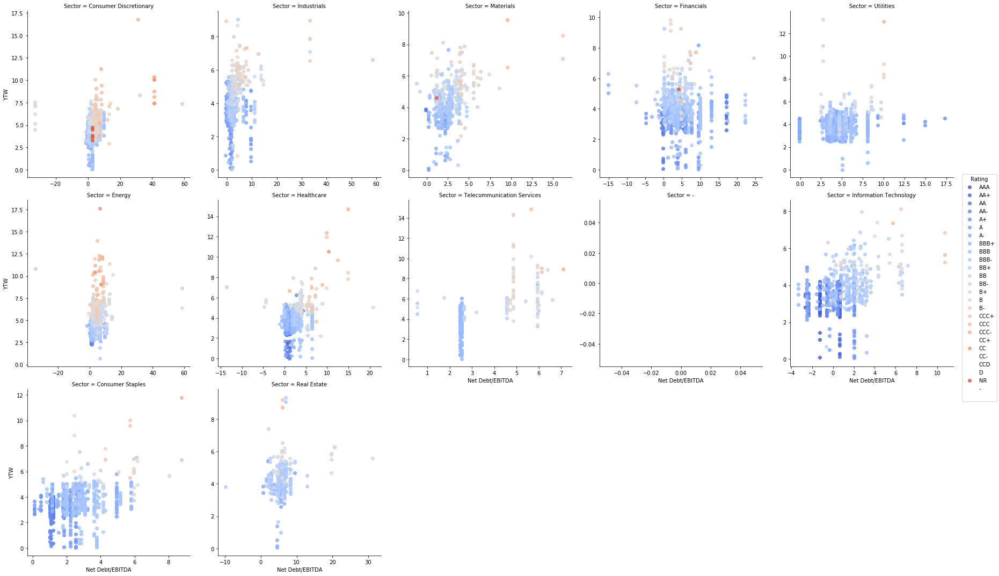

In [223]:
sns.lmplot(x='Net Debt/EBITDA', y='YTW', col='Sector', hue='Rating', palette=sns.color_palette("coolwarm", n_colors=len(ratings_sorted)), hue_order=ratings_sorted,
           data=df_analysis[(df_analysis['Rating'] != '-') & (df_analysis['Rating'] != '') & (df_analysis['Price'] > 80)], sharex=False, sharey=False, fit_reg=False, col_wrap=5);

### FacetGrid scatterplot of YTW vs Price by Seniority

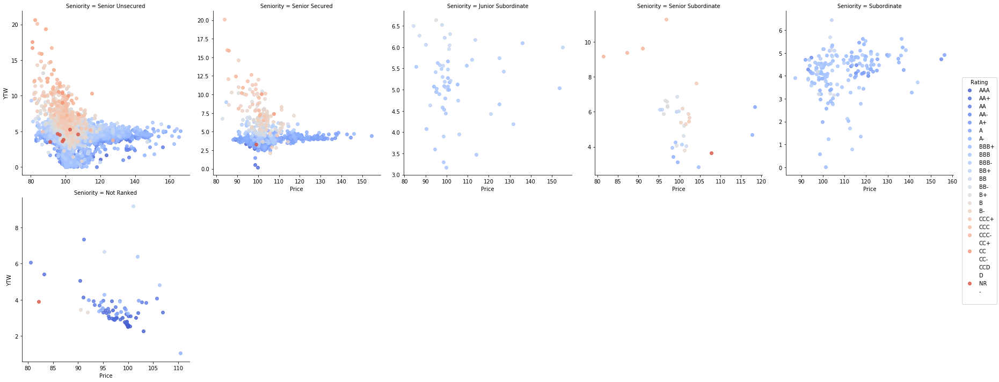

In [224]:
sns.lmplot(x='Price', y='YTW', col='Seniority', hue='Rating', palette=sns.color_palette("coolwarm", n_colors=len(ratings_sorted)), hue_order=ratings_sorted,
           data=df_analysis[(df_analysis['Rating'] != '-') & (df_analysis['Rating'] != '') & (df_analysis['Price'] > 80)], sharex=False, sharey=False, fit_reg=False, col_wrap=5);

### Scikit-Learn regressor selection
Run the regression using all linear regressors in Scikit-Learn. Some regressors are unsuitable for this purpose or take a very long time - screen those out by running the regression on a limited dataset

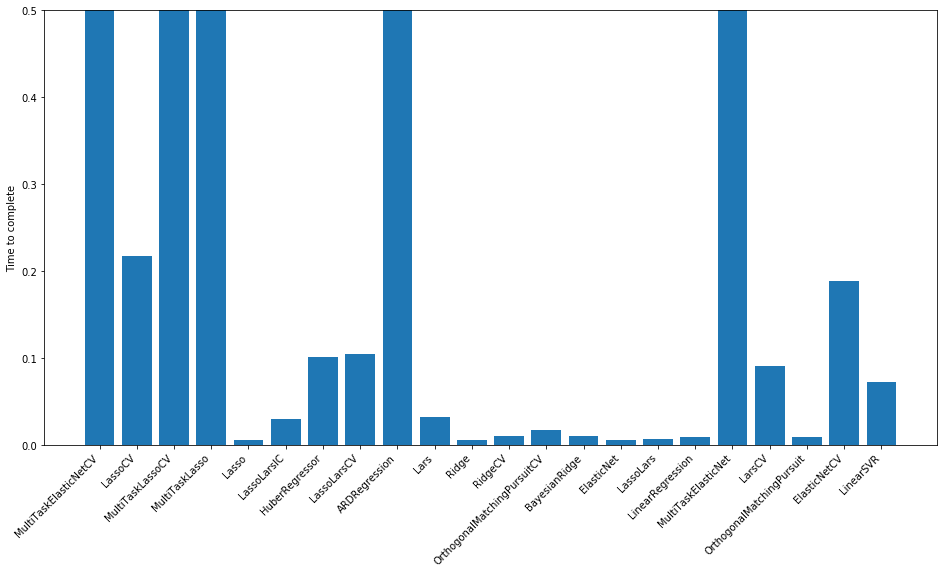

In [304]:
# run regression using all linear regressors with default settings
from sklearn.utils.testing import all_estimators
from sklearn import base
import time
import warnings

linear_regressors = {}
for name, class_ in all_estimators(type_filter='regressor'):
    if issubclass(class_, linear_model.base.LinearModel):
        linear_regressors[name] = class_()
del linear_regressors['TheilSenRegressor']

time_dict = {}
for clf in linear_regressors:
    start_time = time.time()
    try:
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            model_selection.cross_val_score(linear_regressors[clf], train[:500], y=df_analysis['YTW'][:500], cv=model_selection.KFold(shuffle=True, random_state=1), scoring='r2')
        time_dict[clf] = time.time() - start_time
    except:
        time_dict[clf] = 100
        
fig, ax = plt.subplots(1)
ax.bar(time_dict.keys(), time_dict.values())
ax.set_ylim([0, 0.5])
ax.set_xticklabels(time_dict.keys(), rotation=45, horizontalalignment='right');
ax.set_ylabel('Time to complete');

### Run the regression using selected regressors on the full dataset
Using default hyperparameters - this is not optimal and should be done using BayesianSearchCV, but a decent start.

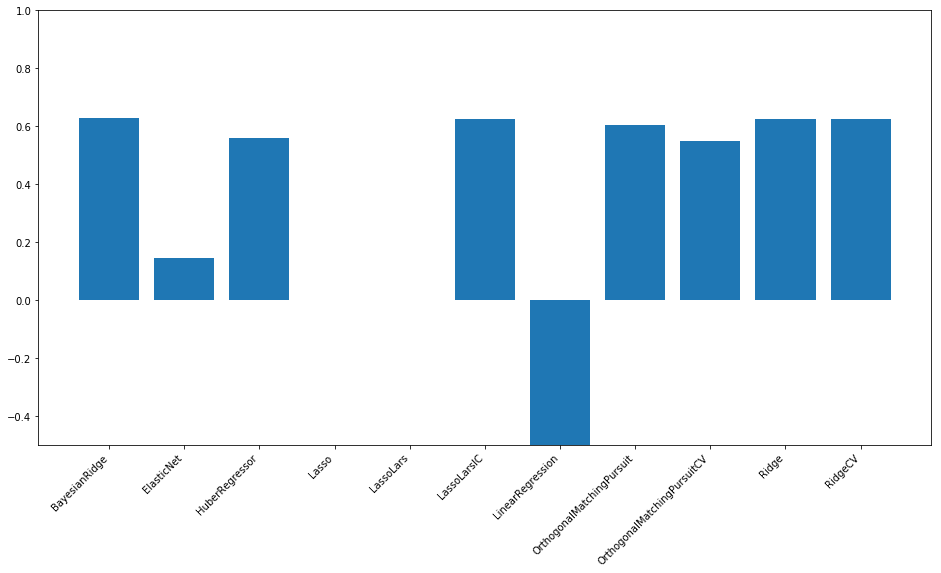

In [320]:
regressor_scores = {}
for clf in linear_regressors:
    if time_dict[clf] < 0.2:
        regressor_scores[clf] = model_selection.cross_val_score(linear_regressors[clf], train, y=df_analysis['YTW'], cv=model_selection.KFold(shuffle=True, random_state=1), scoring='r2')
fig, ax = plt.subplots(1)
df_regressor_scores = pd.DataFrame(regressor_scores)
ax.bar(df_regressor_scores.mean().index, df_regressor_scores.mean().values)
ax.set_ylim([-0.5, 1])
ax.set_xticklabels(df_regressor_scores.mean().index, rotation=45, horizontalalignment='right');

In [616]:
df_analysis.groupby(['Parent Name', 'Seniority'])[['Net Debt (Parent)', 'Amount Outstanding']].sum().sort_index().unstack().to_excel('a.xlsx')